### Cat Localization
#### benchmarking https://www.youtube.com/watch?v=GSwYGkTfOKk&list=PLkDaE6sCZn6Gl29AoE31iwdVwSG-KnDzF&index=23

In [2]:
# 필요한 패키지들
import cv2, os
from glob import glob
import numpy as np
import tensorflow as tf

In [15]:
# labelling cat location of cat images from 'cat and dog images' from kaggle (https://www.kaggle.com/tongpython/cat-and-dog?)
# using labelImg
# hand label 200

cat_img = glob('../../Downloads/cat_location/*.jpg')

##### proposal
- x[img] -> y label 로직을 가진 이미지 분류에서
 x[img] -> y label + cat_location으로 변환. (심화버전 whether cat is in the image or not 0/1 추가)

##### problems to solve
1. 이미지 사이즈들이 다 달라서 모델 인풋 전에 resize가 필요한데, xml cat_location 위치도 맞춰서 변환 필요.
2. 라벨에 대한 loss function과 location에 대한 loss function이 같아도 되는 것인지. (동영상에 따르면 문제 없음)



In [16]:
# xml 처리 패키지 xml.etree.ElementTree
from xml.etree import ElementTree as ET
## annotation 내에 size와 bndbox
root = ET.parse(cat_xml[0]).getroot()


for t in root.find('size'):
    print(t)
    
for b in root.find('object/bndbox') :
    print(b.text)
    
x,y,z = root.find('size')

print(x.text,y.text,z.text)

NameError: name 'cat_xml' is not defined

In [17]:
cat_img[1].split('\\')[-1].split('.')[0]

'cat'

In [18]:
# get coordinate from xml file
def get_y(filename) :
    
    assert filename.split('.')[-1] == 'jpg'
    
    # resize image (224,224) if not.
    
    xml = filename.replace('.jpg', '.xml')
    
    if os.path.isfile(xml) :
        
        root = ET.parse(xml).getroot()
        width, height, _ = root.find('size')
        
        
        ratio_x, ratio_y = 224/ int(width.text), 224/ int(height.text)
        
        x_min,y_min,x_max,y_max = root.find('object/bndbox')
        
        return np.array([ratio_x*int(x_min.text), ratio_y*int(y_min.text), ratio_x*int(x_max.text), ratio_y*int(y_max.text)])
    
    else : print('not a file')
        
# load and preprocess image

def get_image(filename) :
    
    img = cv2.imread(filename)
    img = cv2.resize(img,(224,224))/255.0
    
    return img
    

In [20]:
# sample xml output
get_y('../../Downloads\cat_location\cat.79.jpg')

array([ 18.40480962,   4.53179191, 224.        , 216.87861272])

In [21]:
# get image output
x = np.array([get_image(img) for img in cat_img])
y = np.array([get_y(file) for file in cat_img])


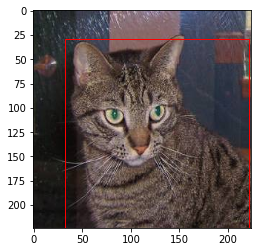

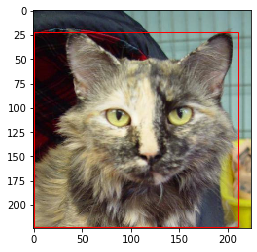

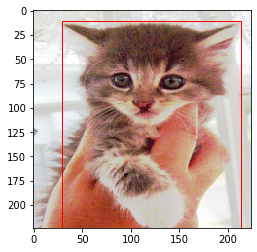

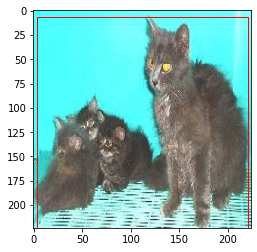

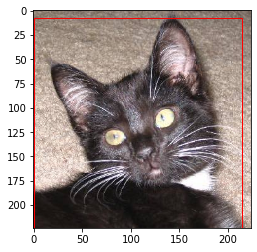

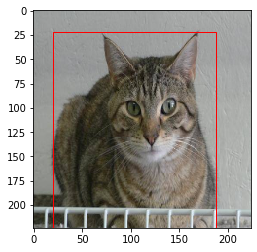

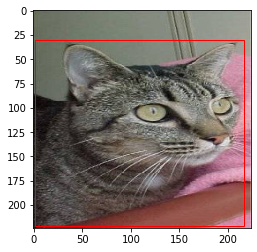

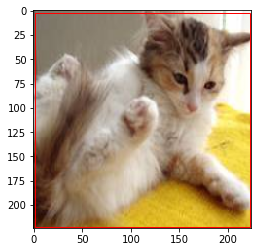

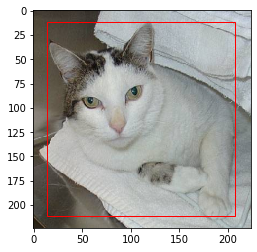

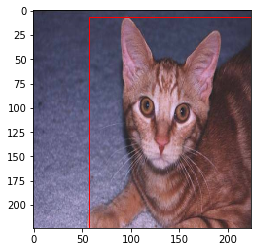

In [22]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

def visualize_box(img, xml) :
    img = img[:,:,::-1] # cv2랑 plt 읽는 법 다름. cv2 : bgr, plt : rgb
    plt.imshow(img)
    plt.gca().add_patch(Rectangle((xml[0], xml[1]), xml[2]-xml[0], xml[3]-xml[1], linewidth=1, edgecolor='r', facecolor='none'))
    plt.show()

    
for samp_img, samp_xml in zip(x[:10],y[:10]) :    
    visualize_box(samp_img, samp_xml)

In [23]:
# build a model

from tensorflow.keras.layers import Dense, MaxPool2D, BatchNormalization, Activation, Conv2D, Dropout, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import Input
from tensorflow.keras.models import Model

def build_model() :
    
    inp = Input((224,224,3))
    
    # Conv2D 
    x = Conv2D(64, 7, padding='same')(inp)
    x = Activation('relu')(x)
    x = MaxPool2D(3)(x)
    x = BatchNormalization()(x)
    
    x = Conv2D(128, 5, padding='same')(x)
    x = Activation('relu')(x)
    x = MaxPool2D(3)(x)
    x = BatchNormalization()(x)
    
    x = Conv2D(64, 5, padding='same')(x)
    x = Activation('relu')(x)
    x = MaxPool2D(3)(x)
    x = BatchNormalization()(x)
    
    x = Conv2D(32, 5, padding='same')(x)
    x = Activation('relu')(x)
    x = MaxPool2D(3)(x)
    x = BatchNormalization()(x)
    
    x = Flatten()(x)
    x = Dense(64)(x)
    x = Activation('relu')(x)
    x = Dropout(0.3)(x)
    output = Dense(4, 'softmax')(x)
    
    model = Model(inputs=inp,outputs=output)
    
    return model
    
    
    

In [24]:
adam = Adam()

model = build_model()


In [25]:
model.compile(loss='mse', optimizer = adam, metrics =['accuracy'])

In [26]:
model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 224, 224, 64)      9472      
_________________________________________________________________
activation_5 (Activation)    (None, 224, 224, 64)      0         
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 74, 74, 64)        0         
_________________________________________________________________
batch_normalization_4 (Batch (None, 74, 74, 64)        256       
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 74, 74, 128)       204928    
_________________________________________________________________
activation_6 (Activation)    (None, 74, 74, 128)       0   

In [27]:
model.fit(x,y, batch_size = 32, epochs = 50)

Train on 200 samples
Epoch 1/50
200/200 [==============================] - 5s 27ms/sample - loss: 21996.5798 - accuracy: 0.4900
Epoch 2/50
200/200 [==============================] - 0s 2ms/sample - loss: 21984.1520 - accuracy: 0.5350
Epoch 3/50
200/200 [==============================] - 0s 2ms/sample - loss: 21982.3477 - accuracy: 0.6050
Epoch 4/50
200/200 [==============================] - 0s 2ms/sample - loss: 21981.2830 - accuracy: 0.6050
Epoch 5/50
200/200 [==============================] - 0s 2ms/sample - loss: 21980.9533 - accuracy: 0.6000
Epoch 6/50
200/200 [==============================] - 0s 2ms/sample - loss: 21980.7672 - accuracy: 0.6150
Epoch 7/50
200/200 [==============================] - 0s 2ms/sample - loss: 21980.3584 - accuracy: 0.6400
Epoch 8/50
200/200 [==============================] - 0s 2ms/sample - loss: 21980.3076 - accuracy: 0.6300
Epoch 9/50
200/200 [==============================] - 0s 2ms/sample - loss: 21980.0227 - accuracy: 0.6500
Epoch 10/50
200/200 [===

In [30]:
#test image

test_cats = glob('../../Downloads/cat_location_test/*.jpg')
len(test_cats)

test_x = np.array([get_image(x) for x in test_cats])

In [31]:
model.save('coord_predict.h5')
prediction = model.predict(test_x)

In [33]:
y

array([[ 32.10666667,  28.8       , 221.76      , 224.        ],
       [  0.45807771,  21.54709419, 210.71574642, 222.65330661],
       [ 28.90322581,  10.3246493 , 213.43920596, 224.        ],
       [  3.78378378,   6.72      , 220.97297297, 224.        ],
       [  0.64183381,   7.18367347, 214.37249284, 224.        ],
       [ 19.264     ,  22.05181347, 187.712     , 224.        ],
       [  0.88537549,  29.75438596, 216.91699605, 221.75438596],
       [  1.04186047,   2.57471264, 222.95813953, 222.71264368],
       [ 14.        ,  11.37967914, 207.2       , 211.42245989],
       [ 57.01002004,   6.4       , 224.        , 223.36      ],
       [ 33.66733467,  54.65060241, 205.59519038, 197.68674699],
       [ 24.192     ,   0.59893048, 187.712     , 224.        ],
       [ 75.35962877,   6.55609756, 192.81670534, 210.34146341],
       [  0.59893048,  29.568     , 202.43850267, 201.6       ],
       [ 21.72575251,   4.40449438, 206.76923077, 224.        ],
       [ 83.328     ,  43

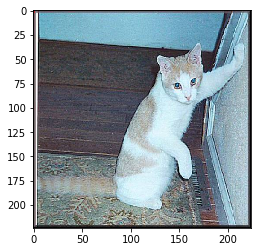

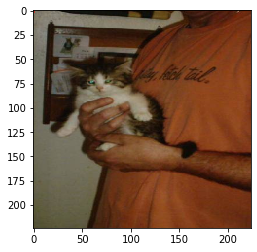

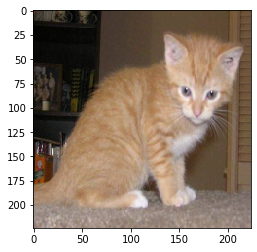

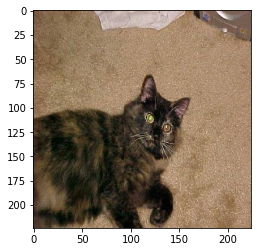

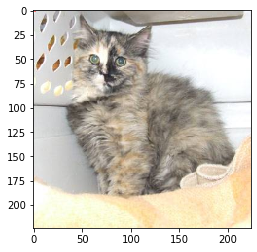

...

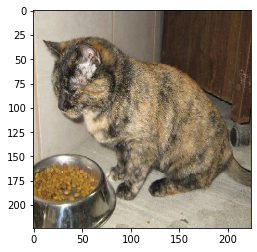

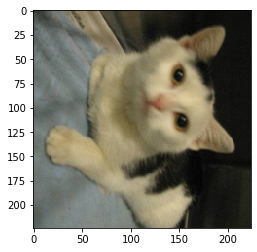

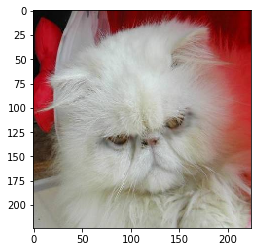

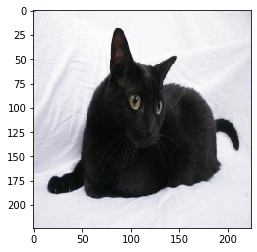

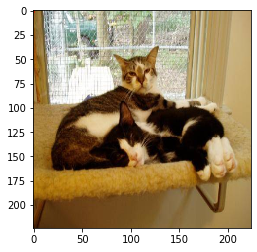

In [34]:
for img, xml in zip(test_x, prediction) :
    visualize_box(img, xml)

In [35]:
prediction

array([[1.01353507e-02, 7.32722646e-03, 2.71248341e-01, 7.11289108e-01],
       [4.55436995e-04, 1.02568069e-03, 1.17389439e-02, 9.86779869e-01],
       [5.57408821e-05, 7.65826408e-05, 1.07743086e-04, 9.99759972e-01],
       [2.36958600e-04, 7.05002400e-04, 1.95235142e-03, 9.97105658e-01],
       [7.24110007e-03, 1.52840978e-02, 8.37212086e-01, 1.40262648e-01],
       [1.87582558e-03, 2.67060637e-03, 2.33992383e-01, 7.61461139e-01],
       [2.92379176e-03, 4.21453221e-03, 5.80465347e-02, 9.34815168e-01],
       [9.59778627e-05, 6.18480481e-05, 4.59608505e-04, 9.99382496e-01],
       [7.33436737e-03, 1.28087550e-02, 4.64444250e-01, 5.15412569e-01],
       [6.05047541e-03, 2.81243678e-03, 1.35091603e-01, 8.56045485e-01],
       [1.05081638e-02, 3.07784677e-02, 8.08269441e-01, 1.50444001e-01],
       [2.01768009e-03, 2.68516899e-03, 2.49211922e-01, 7.46085227e-01],
       [1.72503933e-03, 1.69377832e-03, 6.67094626e-03, 9.89910305e-01],
       [1.80280628e-03, 2.63508386e-03, 7.13901460e

(415, 498, 3)


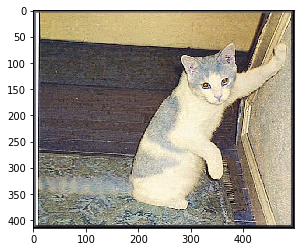